In [1]:
import math

from PIL import Image
import requests
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

import ipywidgets as widgets
from IPython.display import display, clear_output

import torch
from torch import nn
from torchvision.models import resnet50
import torchvision.transforms as T
torch.set_grad_enabled(False);

In [2]:
import os

In [3]:
# COCO classes
COCO_CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

VOC_CLASSES = ["N/A","person","bird", "cat", "cow", "dog", "horse", "sheep",
               "aeroplane", "bicycle", "boat", "bus", "car", "motorbike", "train",
               "bottle", "chair", "dining table", "potted plant", "sofa", "tv/monitor" 
]

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

In [4]:
class_dict = {}
for i in VOC_CLASSES:
    class_dict[i] = []

In [5]:
# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

In [6]:
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{COCO_CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [7]:
model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
model.eval();

Downloading: "https://github.com/facebookresearch/detr/zipball/main" to /root/.cache/torch/hub/main.zip
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 144MB/s] 
Downloading: "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" to /root/.cach

In [8]:
import xml.etree.ElementTree as ET

def extract_objects(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    objects = []
    for obj in root.findall('object'):
        obj_name = obj.find('name').text
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)
        if obj_name in VOC_CLASSES:
            objects.append({
                'name': obj_name,
                'bbox': (xmin, ymin, xmax, ymax)
            })
    return sorted(objects,key=lambda item: item['bbox'])

In [9]:
def get_results(pil_img, prob, boxes):
    colors = COLORS * 100
    objects = []
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        cl = p.argmax()
        if COCO_CLASSES[cl] in VOC_CLASSES:
            objects.append({
                'name': COCO_CLASSES[cl],
                'bbox': (round(xmin,2), round(ymin,2), round(xmax,2), round(ymax,2))
            })
    return sorted(objects,key=lambda item: item['bbox'])

In [34]:
def calculate_iou(boxA, boxB):
    # boxA and boxB are tuples in the format (x1, y1, x2, y2)
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)

    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou

def calculate_average_precision(extracted_objects, ground_objects, iou_threshold=0.5):
    tp = 0  # True Positives
    fp = 0  # False Positives
    fn = 0  # False Negatives

    for pred_obj in extracted_objects:
        max_iou = 0
        matched_gt_obj = None

        for gt_obj in ground_objects:
            iou = calculate_iou(pred_obj['bbox'], gt_obj['bbox'])
            if iou > max_iou:
                max_iou = iou
                matched_gt_obj = gt_obj

        if max_iou >= iou_threshold and pred_obj['name'] == matched_gt_obj['name']:
            tp += 1
        else:
            fp += 1

    fn = len(ground_objects) - tp

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    return precision, recall


In [35]:
counter = 0

for imgp in os.listdir("/kaggle/input/pascalvoc2012-val/VOC2012/JPEGImages"):
    print(imgp)
    im = Image.open(f"/kaggle/input/pascalvoc2012-val/VOC2012/JPEGImages/{imgp}")
    temp = imgp.split('.')
    extracted_objects = extract_objects(f"/kaggle/input/pascalvoc2012-val/VOC2012/Annotations/{temp[0]+'.xml'}")
    print("GROUND TRUTH")
    for obj in extracted_objects:
        print(obj)
    img = transform(im).unsqueeze(0)
    outputs = model(img)
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > 0.9
    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
    get = get_results(im, probas[keep], bboxes_scaled)
    print("PREDICTED")
    for x in get:
        print(x)
    counter+=1
    print("Average precision is", calculate_average_precision(extracted_objects, get))
    if counter==20:
        break

2007_005304.jpg
GROUND TRUTH
{'name': 'person', 'bbox': (1, 2, 472, 400)}
{'name': 'bottle', 'bbox': (264, 75, 391, 282)}
PREDICTED
{'name': 'person', 'bbox': (-0.14, 1.86, 473.93, 398.67)}
{'name': 'bottle', 'bbox': (265.31, 73.41, 390.12, 284.39)}
Average precision is (1.0, 1.0)
2009_002094.jpg
GROUND TRUTH
PREDICTED
Average precision is (0, 0)
2011_006475.jpg
GROUND TRUTH
{'name': 'person', 'bbox': (1, 84, 171, 375)}
{'name': 'person', 'bbox': (266, 92, 500, 375)}
PREDICTED
{'name': 'person', 'bbox': (0.06, 82.6, 171.08, 372.48)}
{'name': 'person', 'bbox': (277.66, 93.16, 499.61, 368.03)}
Average precision is (1.0, 1.0)
2011_000611.jpg
GROUND TRUTH
{'name': 'person', 'bbox': (213, 164, 330, 375)}
PREDICTED
{'name': 'person', 'bbox': (210.34, 166.69, 328.51, 373.75)}
{'name': 'cow', 'bbox': (322.17, 201.59, 346.11, 211.38)}
{'name': 'cow', 'bbox': (355.95, 203.06, 387.13, 216.22)}
{'name': 'cow', 'bbox': (464.15, 202.78, 488.82, 213.03)}
Average precision is (1.0, 0.25)
2009_004042.j

KeyboardInterrupt: 

2012_004331.jpg


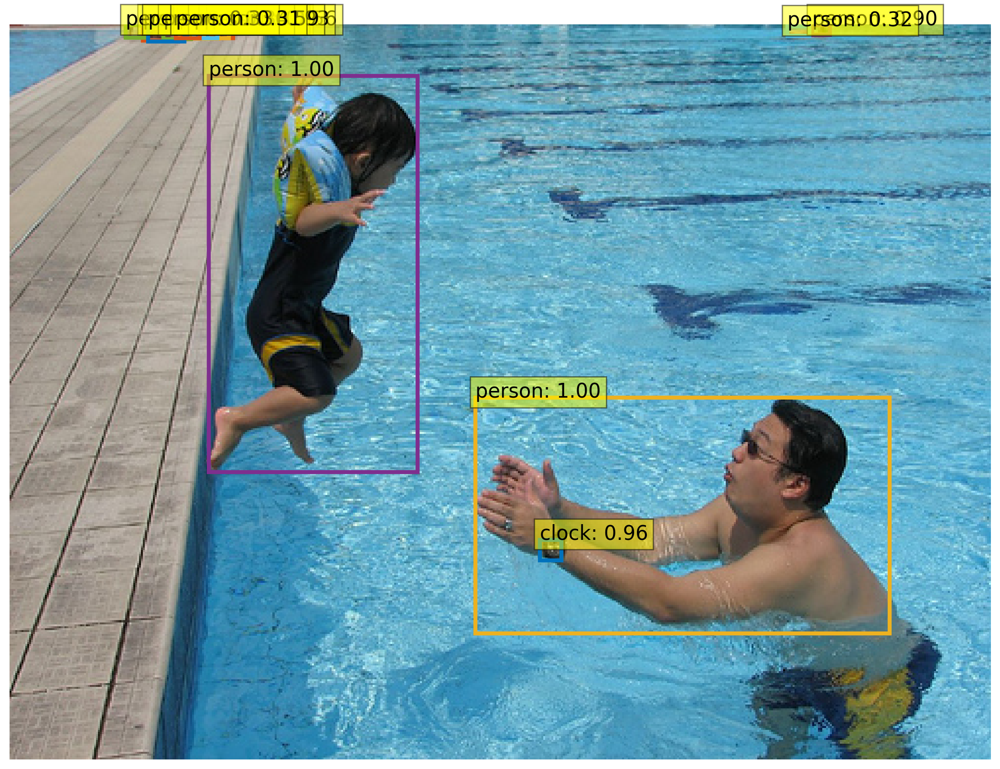

2012_004330.jpg


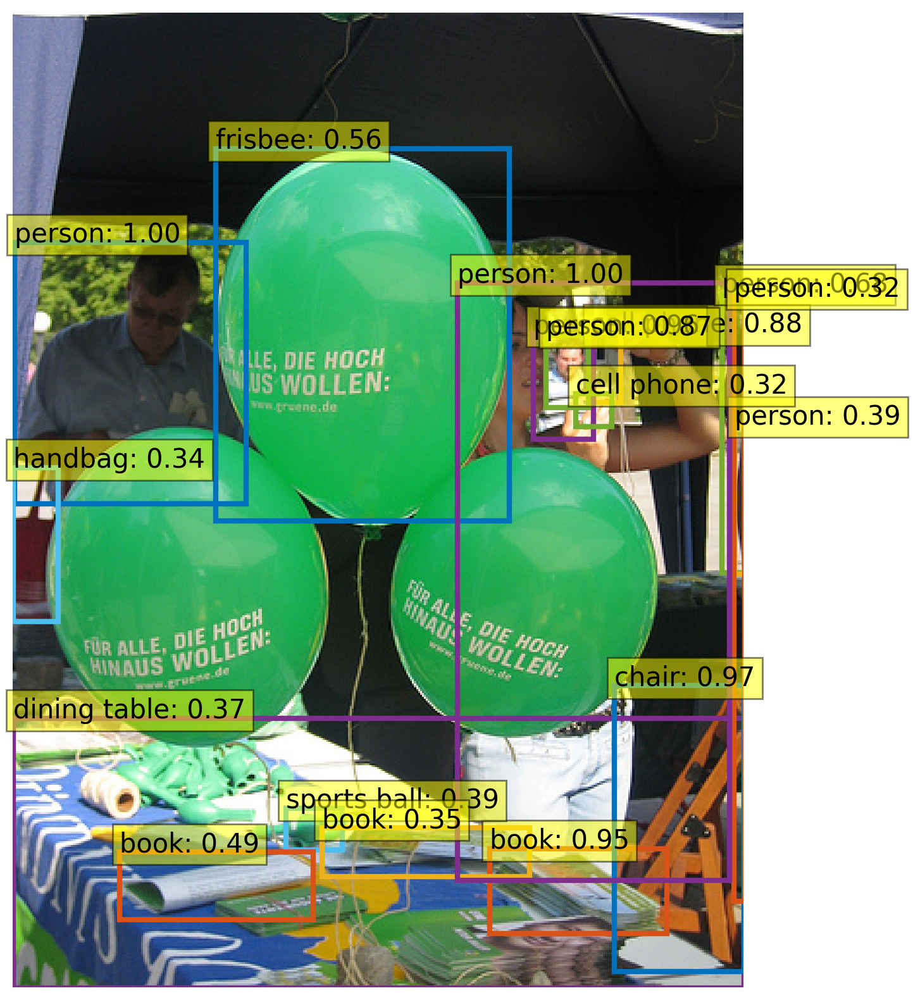

2012_004329.jpg


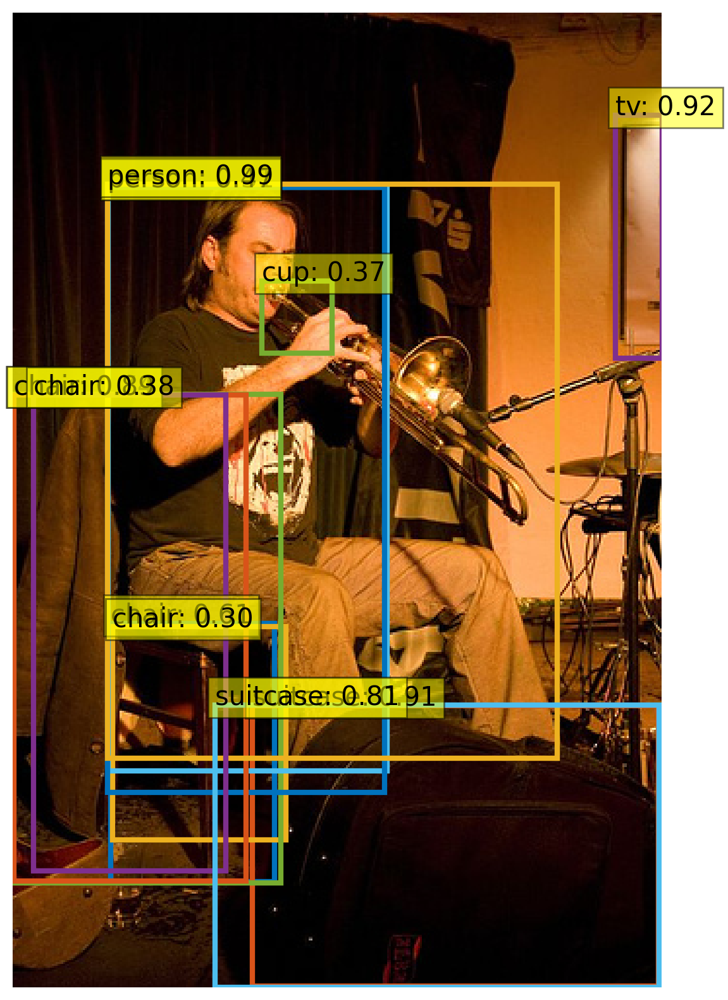

2012_004328.jpg


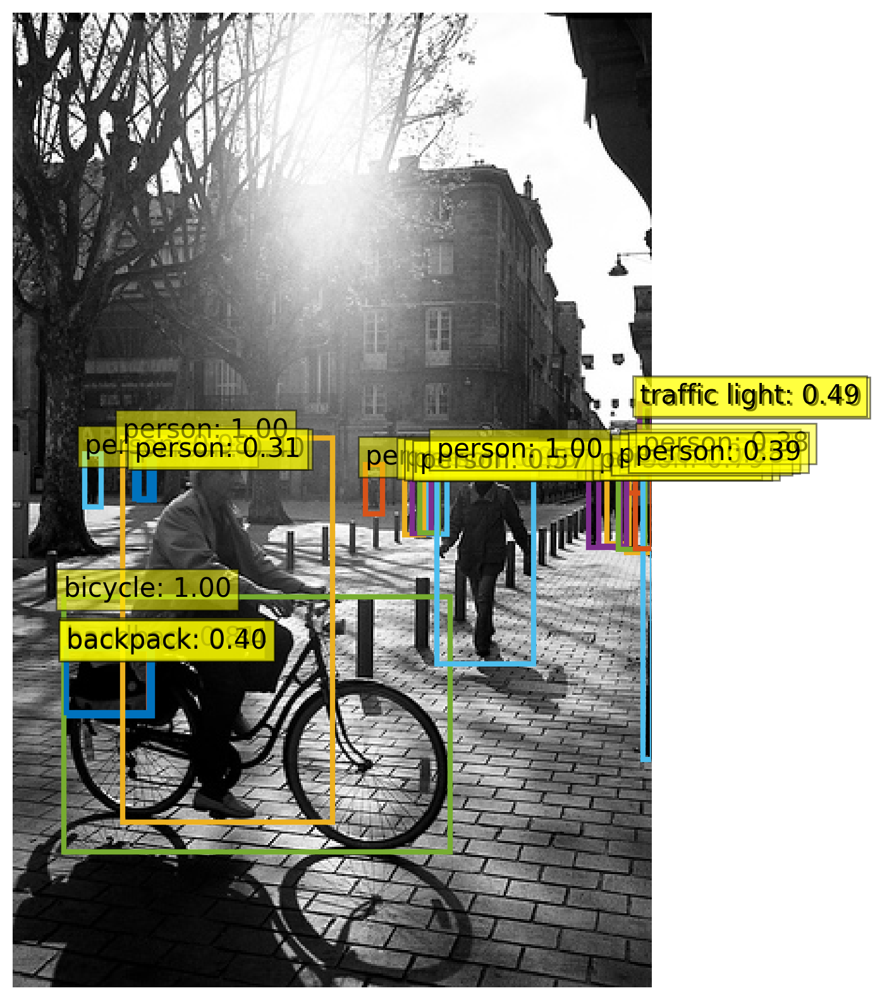

2012_004326.jpg


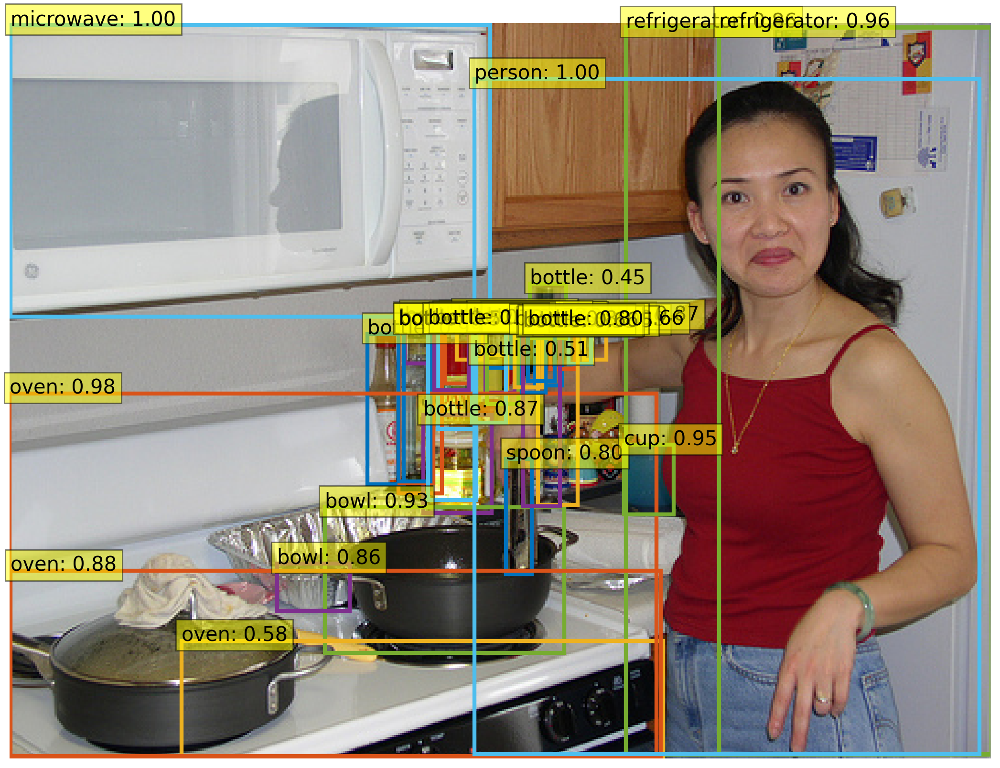

2012_004319.jpg


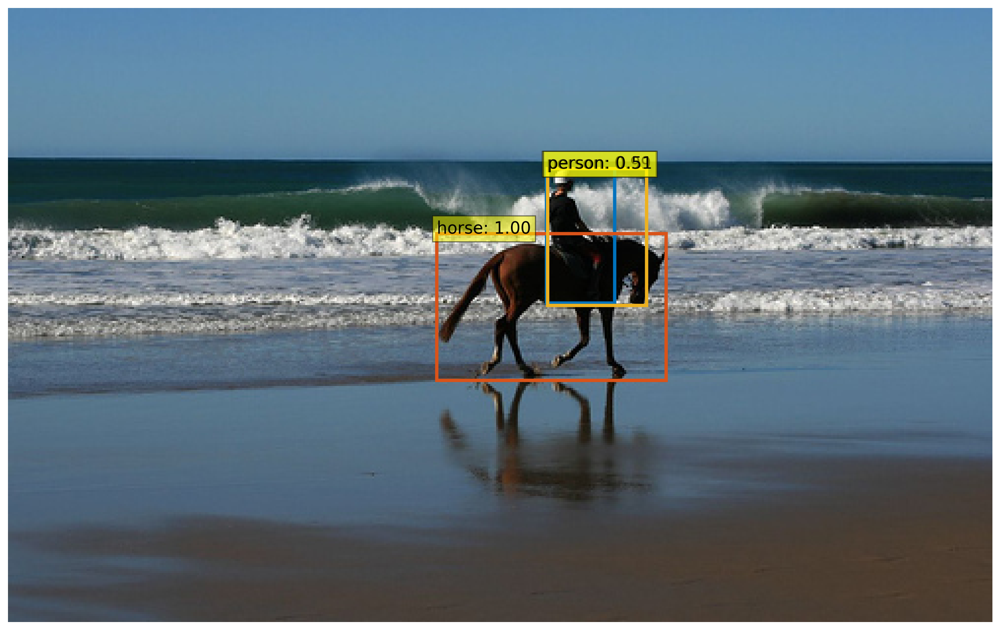

2012_004317.jpg


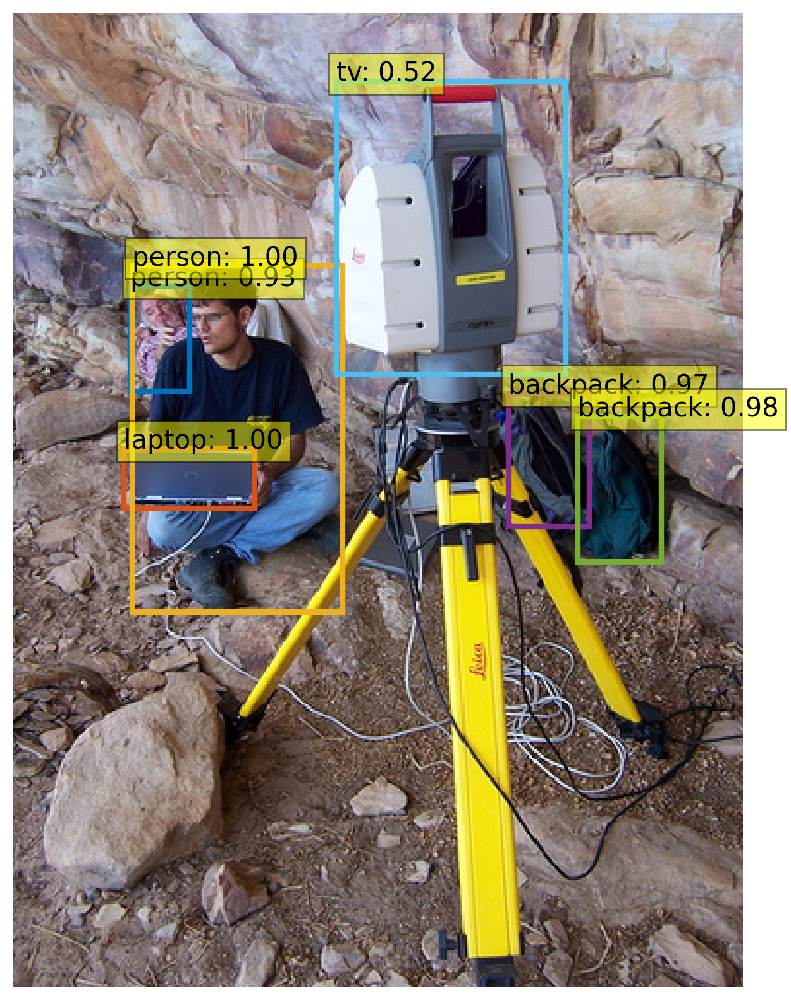

2012_004315.jpg


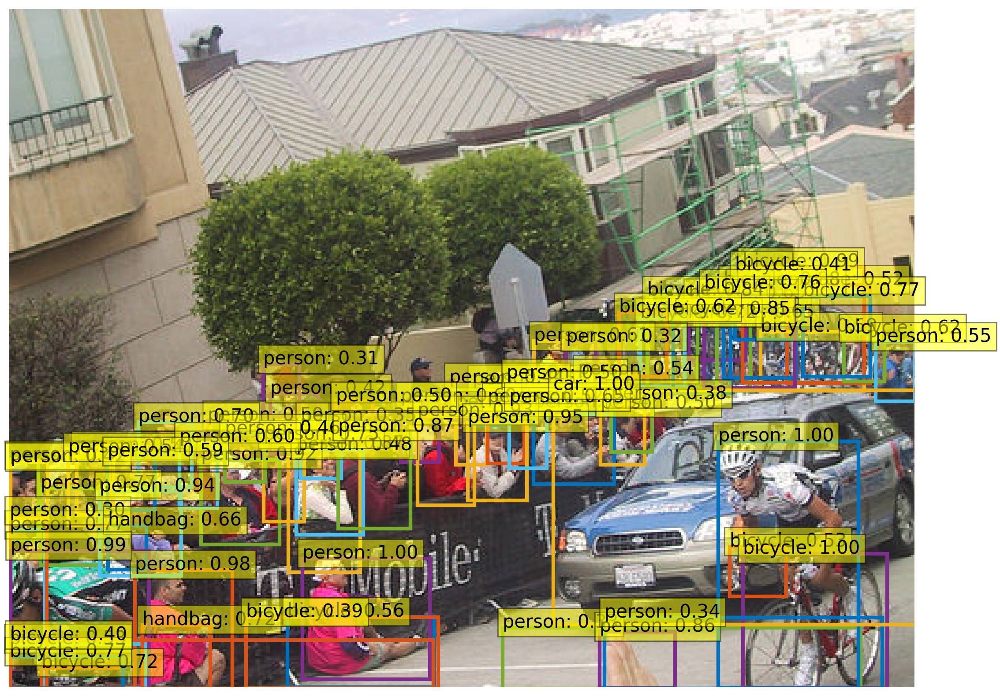

2012_004312.jpg


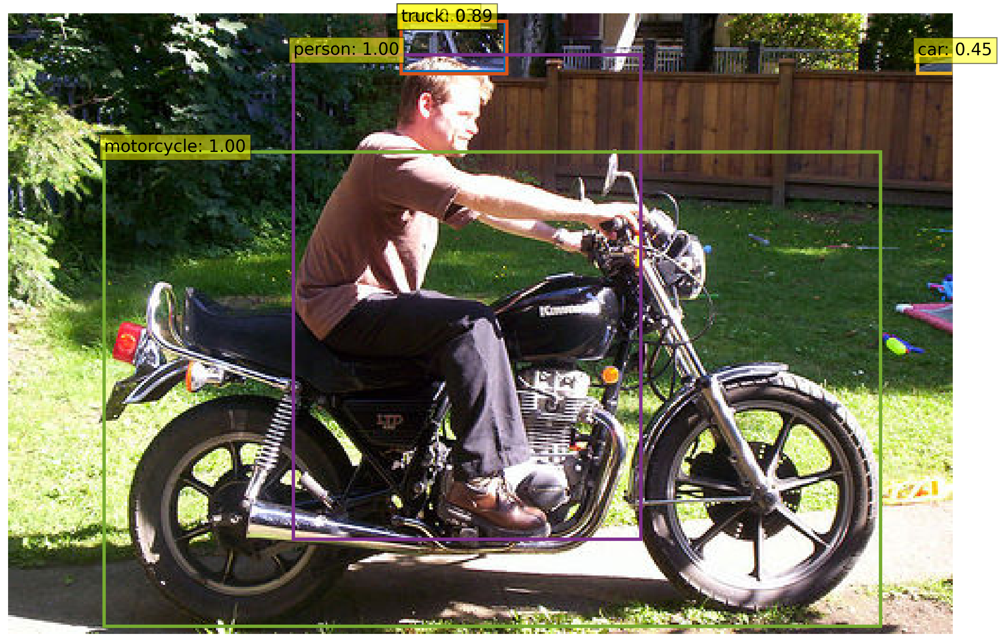

2012_004310.jpg


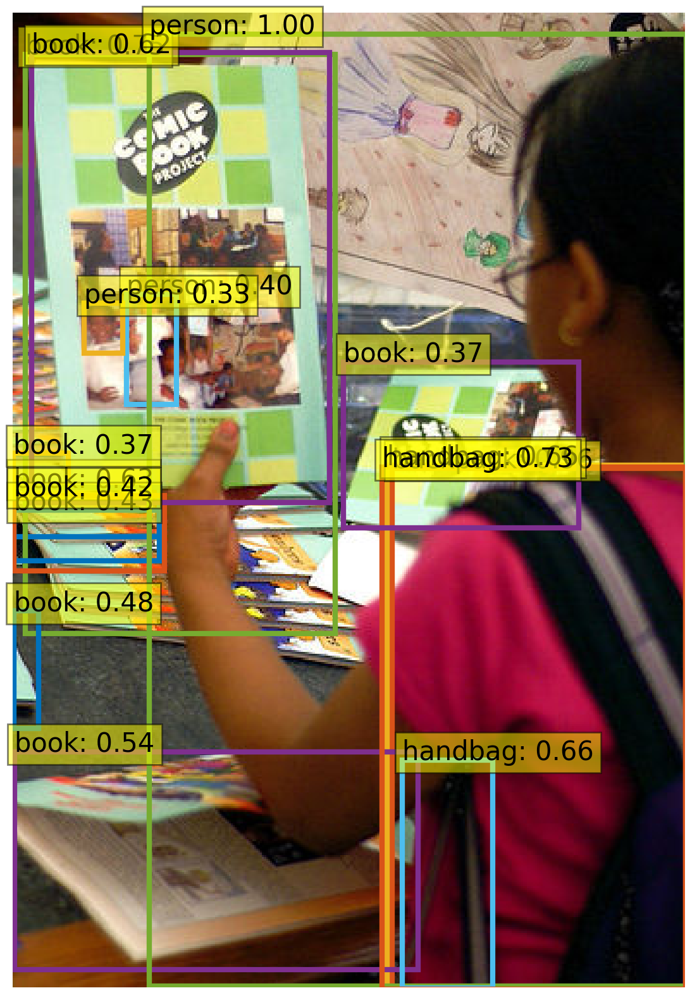

2012_004309.jpg


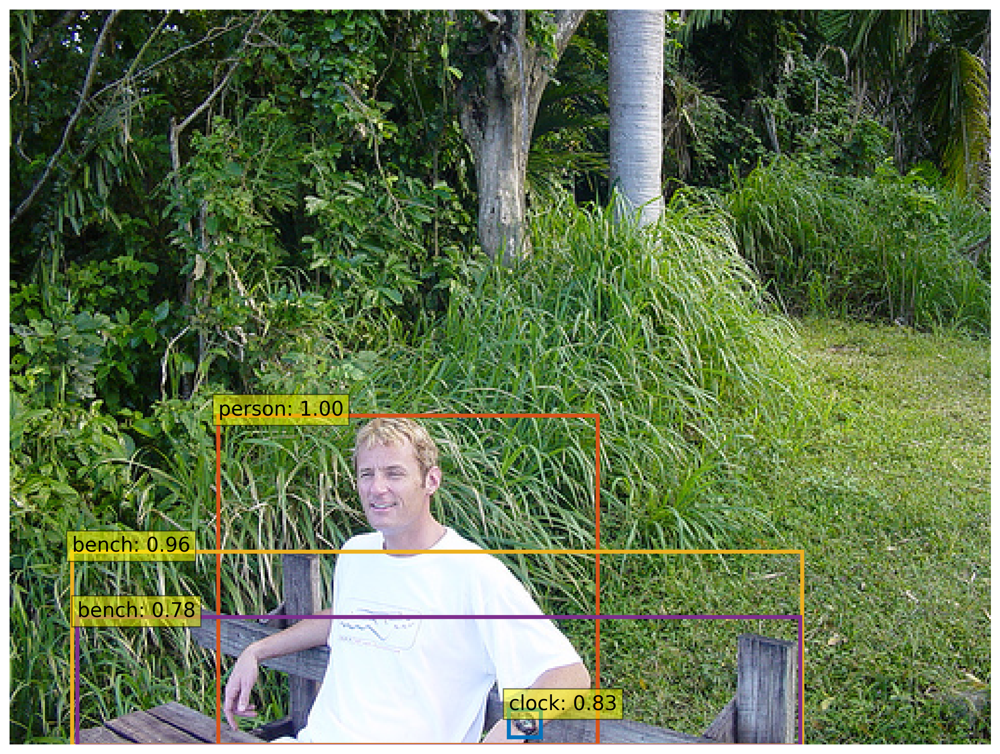

2012_004308.jpg


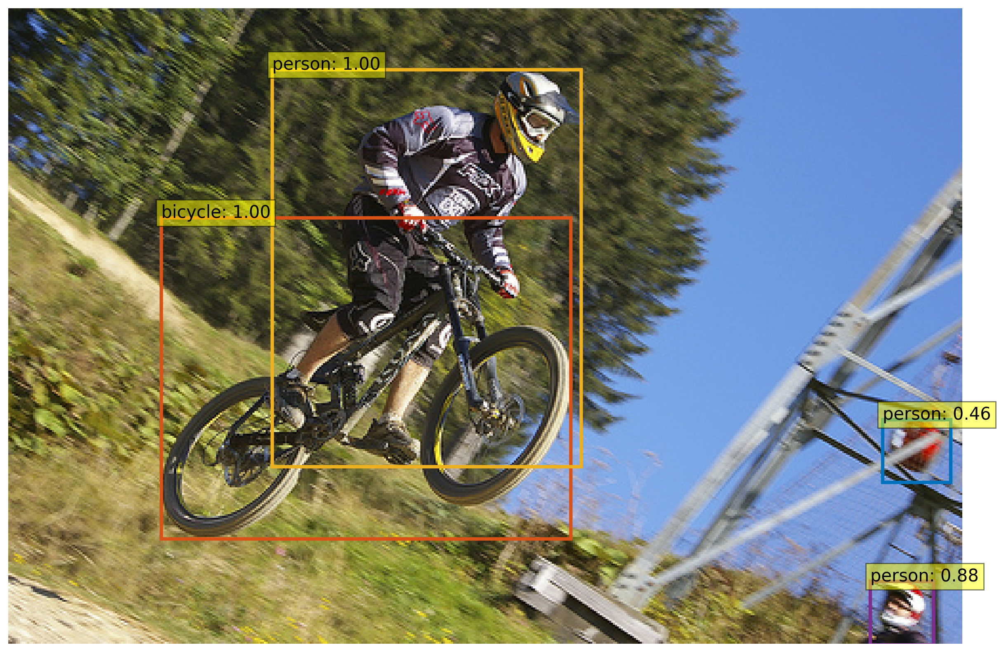

2012_004306.jpg


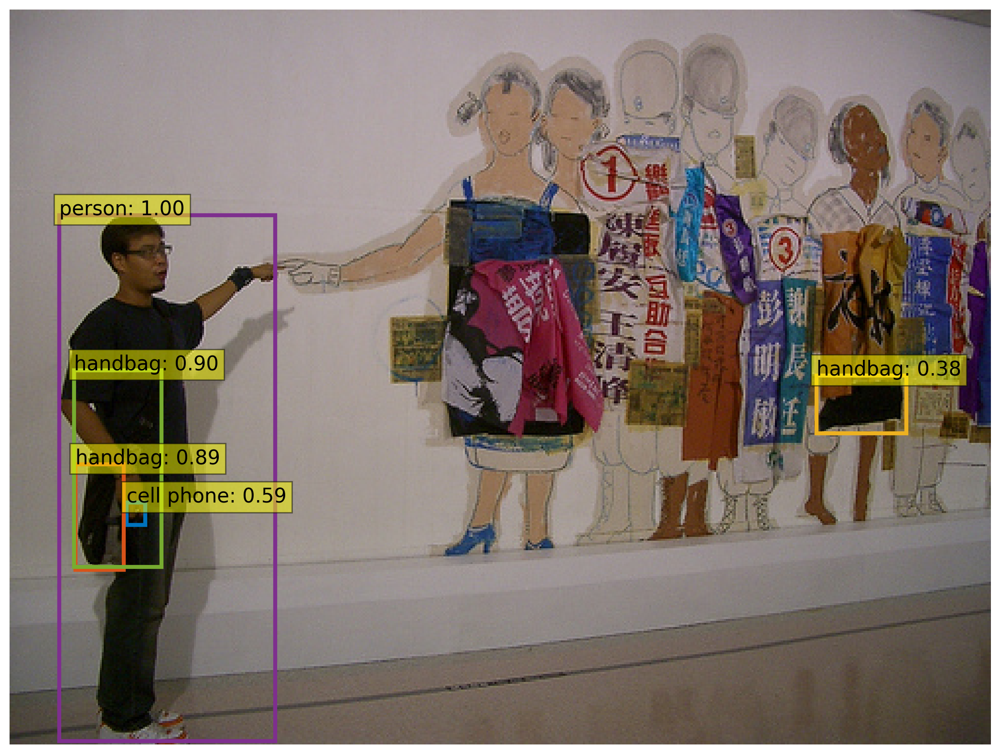

2012_004303.jpg


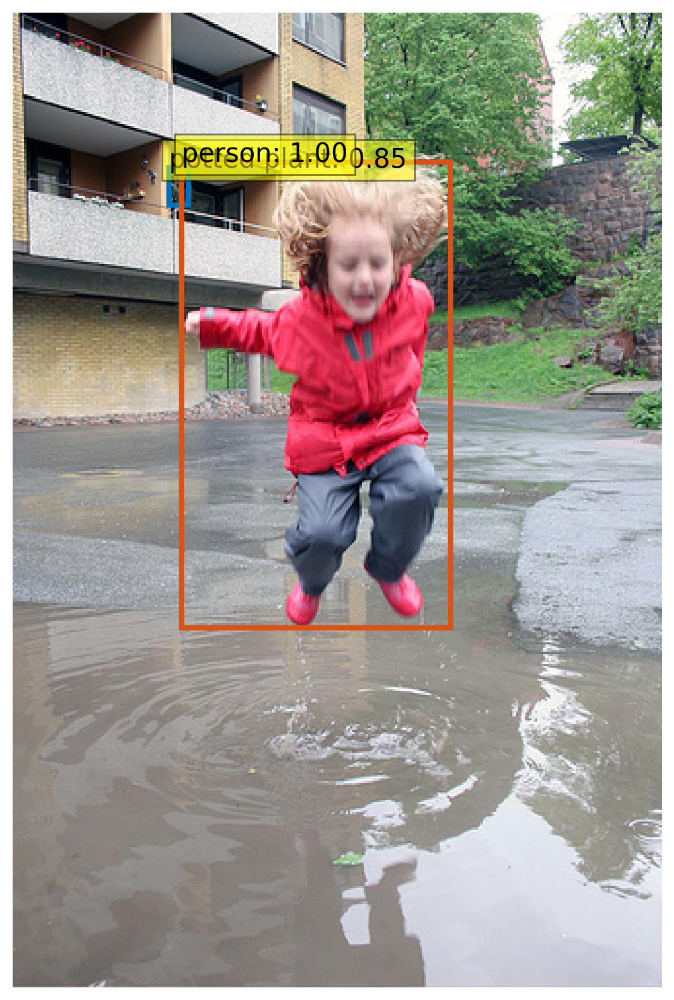

2012_004302.jpg


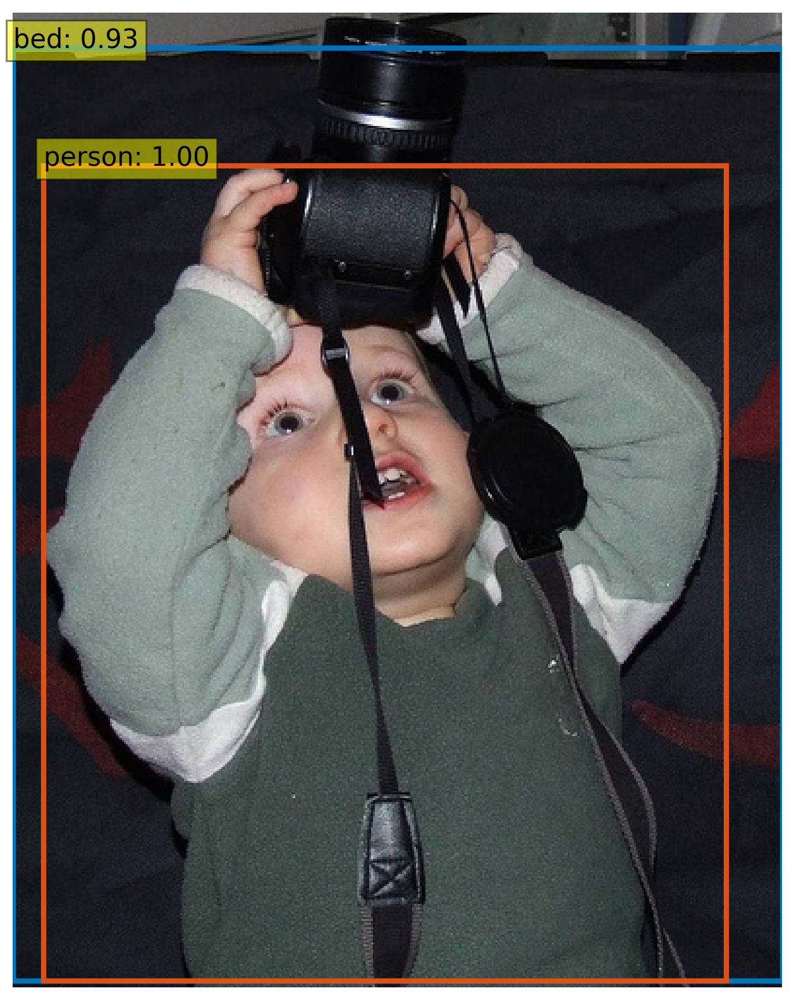

2012_004300.jpg


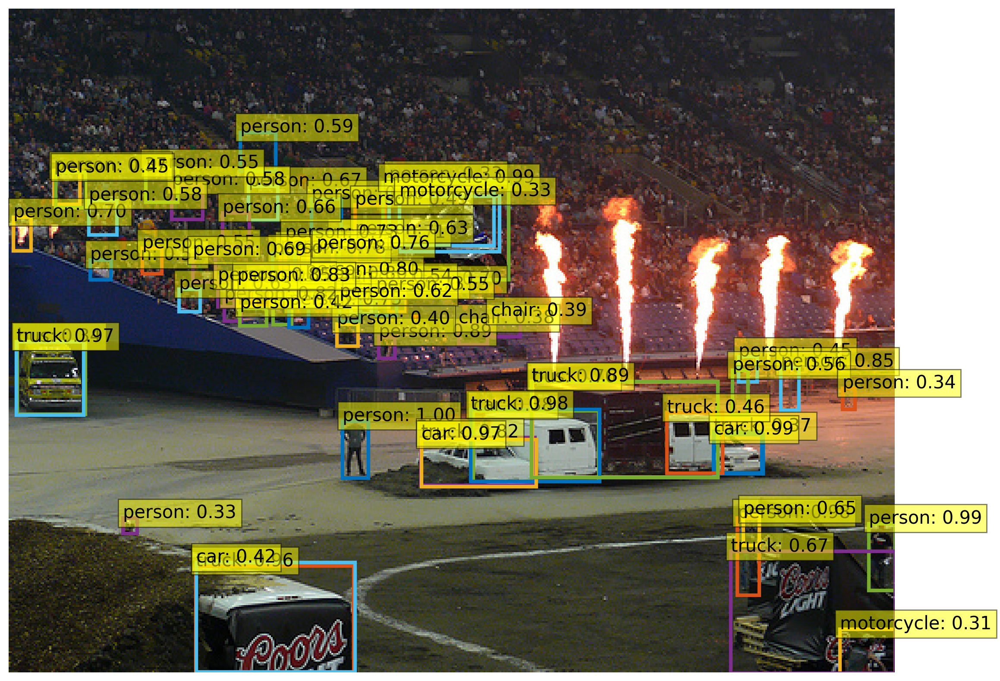

2012_004299.jpg


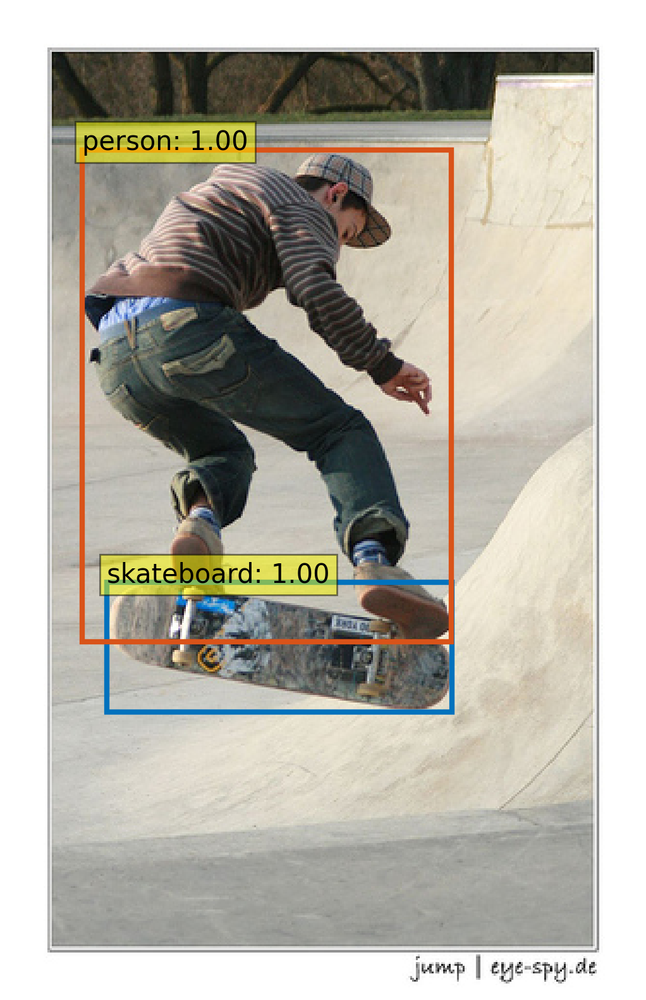

2012_004298.jpg


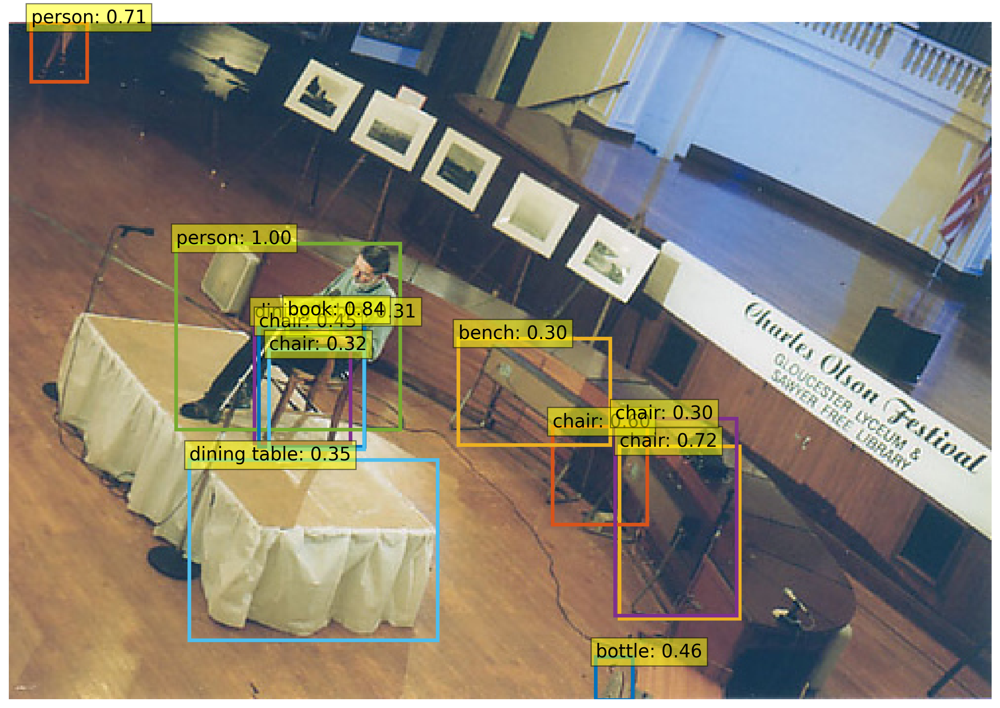

2012_004295.jpg


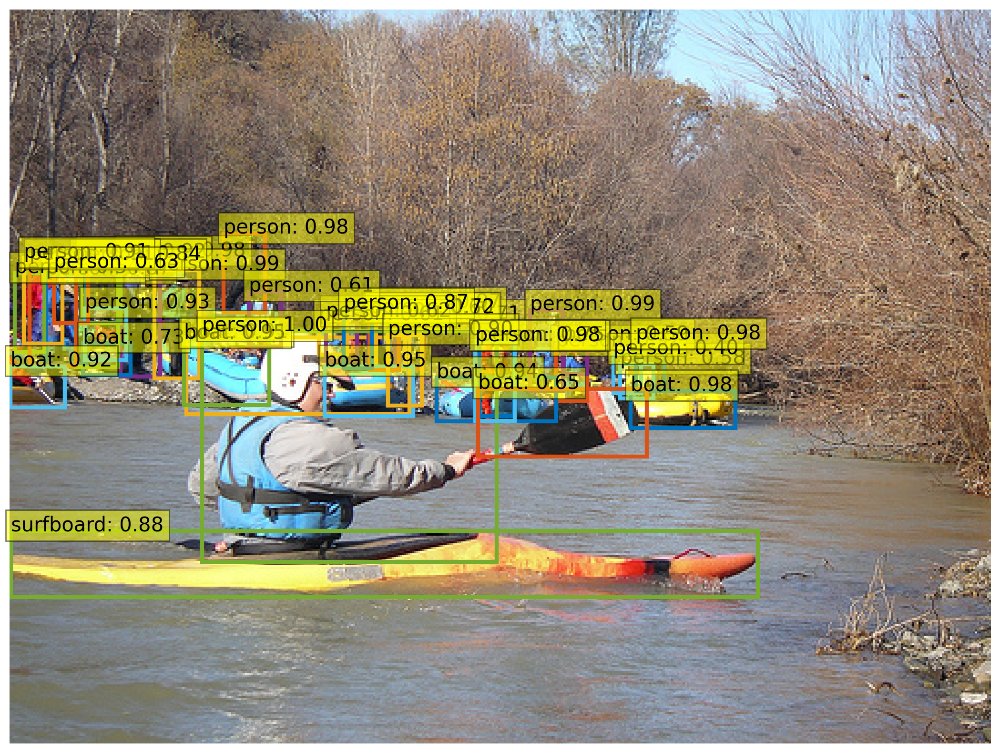

2012_004293.jpg


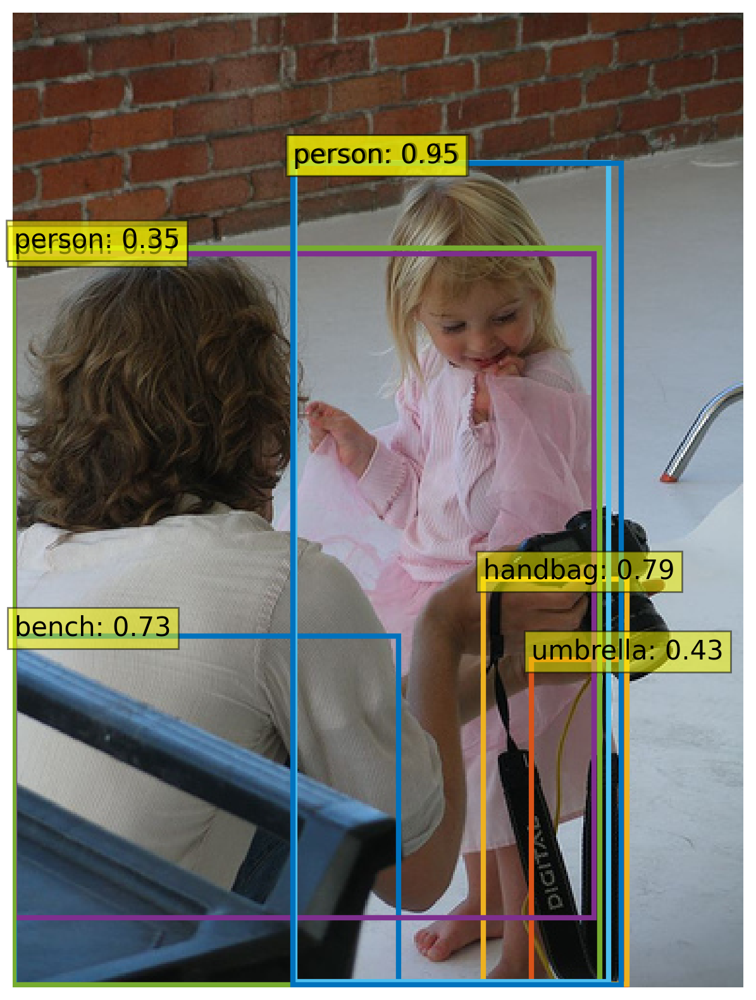

In [20]:
counter = 0

for imgp in reversed(sorted(os.listdir("/kaggle/input/pascalvoc2012-val/VOC2012/JPEGImages"))):
    print(imgp)
    im = Image.open(f"/kaggle/input/pascalvoc2012-val/VOC2012/JPEGImages/{imgp}")
    img = transform(im).unsqueeze(0)
    outputs = model(img)
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > 0.3
    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
    get = plot_results(im, probas[keep], bboxes_scaled)
    counter+=1
    if counter==20:
        break

In [21]:
!wget https://karpathy.github.io/assets/obamafunny.jpg

--2024-05-10 18:15:05--  https://karpathy.github.io/assets/obamafunny.jpg
Resolving karpathy.github.io (karpathy.github.io)... 185.199.108.153, 185.199.109.153, 185.199.110.153, ...
Connecting to karpathy.github.io (karpathy.github.io)|185.199.108.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 249084 (243K) [image/jpeg]
Saving to: 'obamafunny.jpg'

obamafunny.jpg      100%[===================>] 243.25K  --.-KB/s    in 0.04s   

2024-05-10 18:15:05 (6.25 MB/s) - 'obamafunny.jpg' saved [249084/249084]



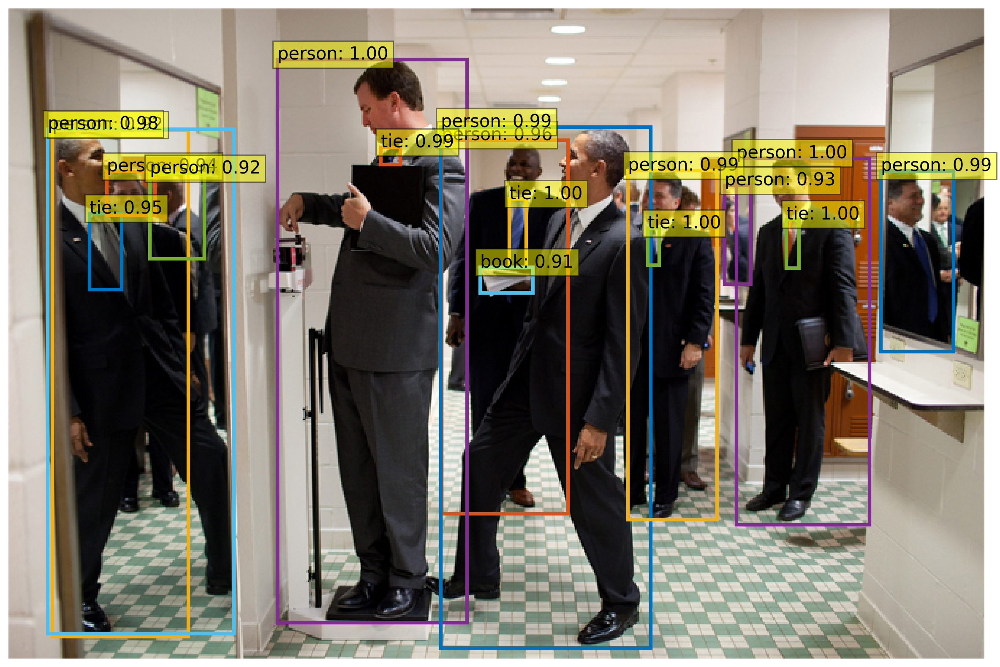

In [23]:
im = Image.open("/kaggle/working/obamafunny.jpg")
img = transform(im).unsqueeze(0)
outputs = model(img)
probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
keep = probas.max(-1).values > 0.9
bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
get = plot_results(im, probas[keep], bboxes_scaled)